### Load Library

In [1]:
# Load library
import os 
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import distance
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
from scipy import signal

In [ ]:
'''
# # Task Steps: 
# 1. load data
# 2. data에서 rr-interval 개수 확인
# 3. 90%, 95% 식으로 cutoff설정
# 4. cutoff설정된 값으로 return되는 value, value개수 확인
# 5. optional 눈으로 graph를 겹쳐보아요~!

'''

In [ ]:
# Task steps:

1. load data
    PATH_IN = r'C:\Users\MI2RL-KHJ\workspace_signal\mit\processed_norm'
    1-1. cosine similarity: ex) 'cos_sim_norm_00_89.csv',  'cos_sim_norm_01_127.csv', 'cos_sim_norm_02_96.csv'
    1-2. rpeak: ex) 'correct_rpeaks_test_norm_ecg_norm_00.csv', 'correct_rpeaks_test_norm_ecg_norm_01.csv',
    1-3. y-values: ex) 'filtered_test_norm_ecg_norm_00.csv', 'filtered_test_norm_ecg_norm_01.csv',
2. 


### Load Data

In [2]:
# load data for cosine-similarity
PATH_IN = r'C:\Users\MI2RL-KHJ\workspace_signal\mit\processed_norm'
cos_path = os.chdir(os.path.join(PATH_IN, 'cosine_sim'))

cos_sim_norm = [i for i in os.listdir(cos_path )]

In [3]:
cos_sim_norm
# ['cos_disc',
#  'cos_sim_norm_00_89.csv',
#  'cos_sim_norm_01_127.csv',
#  'cos_sim_norm_02_96.csv',
#  'cos_sim_norm_03_92.csv',...]

['cos_disc',
 'cos_sim_norm_00_89.csv',
 'cos_sim_norm_01_127.csv',
 'cos_sim_norm_02_96.csv',
 'cos_sim_norm_03_92.csv',
 'cos_sim_norm_04_82.csv',
 'cos_sim_norm_05_123.csv',
 'cos_sim_norm_06_101.csv',
 'cos_sim_norm_07_107.csv',
 'cos_sim_norm_08_89.csv',
 'cos_sim_norm_09_121.csv',
 'cos_sim_norm_10_86.csv',
 'cos_sim_norm_11_89.csv',
 'cos_sim_norm_12_96.csv',
 'cos_sim_norm_13_81.csv',
 'cos_sim_norm_14_94.csv',
 'cos_sim_norm_15_111.csv',
 'cos_sim_norm_16_92.csv',
 'cos_sim_norm_17_69.csv',
 'tmp']

In [4]:
cos_df = pd.read_csv(cos_sim_norm[1])
cos_df.head()

,Unnamed: 0,index,cos_sim,original_points
0,0,1406,0.999919,96
1,1,2347,0.999893,93
2,2,2859,0.999891,99
3,3,399,0.999891,94
4,4,2158,0.999891,94


In [5]:
# load data 
rpeakList = [i for i in os.listdir(PATH_IN) if i.startswith('correct')]
fxvalList = [i for i in os.listdir(PATH_IN) if i.startswith('filtered')]

In [6]:
rpeakList, fxvalList

(['correct_rpeaks_test_norm_ecg_norm_00.csv',
  'correct_rpeaks_test_norm_ecg_norm_01.csv',
  'correct_rpeaks_test_norm_ecg_norm_02.csv',
  'correct_rpeaks_test_norm_ecg_norm_03.csv',
  'correct_rpeaks_test_norm_ecg_norm_04.csv',
  'correct_rpeaks_test_norm_ecg_norm_05.csv',
  'correct_rpeaks_test_norm_ecg_norm_06.csv',
  'correct_rpeaks_test_norm_ecg_norm_07.csv',
  'correct_rpeaks_test_norm_ecg_norm_08.csv',
  'correct_rpeaks_test_norm_ecg_norm_09.csv',
  'correct_rpeaks_test_norm_ecg_norm_10.csv',
  'correct_rpeaks_test_norm_ecg_norm_11.csv',
  'correct_rpeaks_test_norm_ecg_norm_12.csv',
  'correct_rpeaks_test_norm_ecg_norm_13.csv',
  'correct_rpeaks_test_norm_ecg_norm_14.csv',
  'correct_rpeaks_test_norm_ecg_norm_15.csv',
  'correct_rpeaks_test_norm_ecg_norm_16.csv',
  'correct_rpeaks_test_norm_ecg_norm_17.csv'],
 ['filtered_test_norm_ecg_norm_00.csv',
  'filtered_test_norm_ecg_norm_01.csv',
  'filtered_test_norm_ecg_norm_02.csv',
  'filtered_test_norm_ecg_norm_03.csv',
  'filtered

In [7]:
# check sample 
rpeaks = pd.read_csv(os.path.join(PATH_IN, rpeakList[0]), header=None)
yvals = pd.read_csv(os.path.join(PATH_IN, fxvalList[0]), header=None)

In [12]:
# rpeaks, yvals: dataframe to list 
rpeaksList = list(np.array(rpeaks[0].tolist())) 
yvalsList = list(np.array(yvals[0].tolist()))
ryvalList = [ yvalsList[int(r)] for r in rpeaksList ]

# original plot with rpeaks 
%matplotlib
plt.plot(yvalsList)
plt.plot(rpeaksList ,ryvalList, "r*")
plt.grid()

Using matplotlib backend: Qt5Agg


In [13]:
360*0.3

108.0

In [8]:
rpeaks.head(), yvals.head(), rpeakList[0] ,cos_sim_norm[1]

(       0
 0  116.0
 1  209.0
 2  298.0
 3  392.0
 4  498.0,
           0
 0 -0.001539
 1 -0.020544
 2 -0.016044
 3 -0.030780
 4 -0.040764,
 'correct_rpeaks_test_norm_ecg_norm_00.csv',
 'cos_sim_norm_00_89.csv')

In [9]:
cos_df

,Unnamed: 0,index,cos_sim,original_points
0,0,1406,0.999919,96
1,1,2347,0.999893,93
2,2,2859,0.999891,99
3,3,399,0.999891,94
4,4,2158,0.999891,94
...,...,...,...,...
5151,5151,675,0.989159,45
5152,5152,4905,0.986905,34
5153,5153,3599,0.984791,20
5154,5154,3681,0.984658,198


### Normalization

In [349]:
# Task: amplitude Normalization

# min-max normalization 
min_max_scaler = MinMaxScaler()
# fyvals 

# minmax normalization for fxvals(ECG Voltage)
yvals_MinMax = min_max_scaler.fit_transform(yvals)

# examples
yvals_MinMax[370], yvals_MinMax[662], yvals_MinMax[947]


np.max(yvals_MinMax), np.min(yvals_MinMax)

(1.0, 0.0)

In [ ]:
sum(yvals_MinMax.tolist(), [])

In [ ]:
yvals_MinMax

In [82]:
# Task: 1. R-R interval 나누기 + 3. R-R time frame(data points) Normalization 


from scipy import signal


# DataFrame: rr-interval + Norm_amplitude_yvalue
def minmax_norm_amplitude(rpeaks, yvals_MinMax):
    df_rr_intervals = pd.DataFrame(columns=['RR_index', 'Origin_Rpeak', 'RR_range_idx', 'RR_interval','Norm_amplitude_yvalue'])

    for i in range(len(rpeaks)):
        if i + 1 == len(rpeaks):
            #rr_range_idx = i+1
            break
        else:
            origin_rpeak = rpeaks.iloc[i]
            rr_range_idx = (i, i+1)
            rr_interval = rpeaks.iloc[i+1] - rpeaks.iloc[i]
            new_yval = yvals_MinMax[int(rpeaks.iloc[i]):int(rpeaks.iloc[i+1])]
            new_yval_1d = sum(new_yval.tolist(), [])

            print(i, origin_rpeak, rr_range_idx, rr_interval, [new_yval_1d])
            tmp = pd.DataFrame({'RR_index':i, 'Origin_Rpeak':origin_rpeak, 'RR_range_idx':rr_range_idx, 'RR_interval':rr_interval,'Norm_amplitude_yvalue':[new_yval_1d]})
            print(tmp)

#             # add data into dictionary(dataframe )
#             tmp = pd.DataFrame({'RR_index':i, 'Origin_Rpeak': origin_rpeak, 'RR_range_idx': rr_range_idx, 'RR_interval':rr_interval, 'Norm_amplitude_yvalue': [new_yval_1d]})
#                                 # "rr_index: i " means 0:rpeak[1]-rpeak[0]
            df_rr_intervals = pd.concat([df_rr_intervals, tmp])
    return df_rr_intervals


In [104]:
# Task: 1. R-R interval 나누기 + 3. R-R time frame(data points) Normalization 


from scipy import signal


# DataFrame: rr-interval + Norm_amplitude_yvalue
def minmax_norm_amplitude(rpeaks, yvals_MinMax):
    df_rr_intervals = pd.DataFrame(columns=['RR_index', 'Origin_Rpeak', 'RR_range_idx', 'RR_interval','Norm_amplitude_yvalue'])

    for i in range(len(rpeaks)):
        if i + 1 == len(rpeaks):
            #rr_range_idx = i+1
            break
        else:
            origin_rpeak = rpeaks.iloc[i]
            rr_range_idx =[i, i+1]
            # list to str
            rr_range_idx = ','.join(str(e) for e in rr_range_idx)
            rr_interval = rpeaks.iloc[i+1] - rpeaks.iloc[i]
            new_yval = yvals_MinMax[int(rpeaks.iloc[i]):int(rpeaks.iloc[i+1])]
            new_yval_1d = sum(new_yval.tolist(), [])

            # add data into dictionary(dataframe)
            tmp = pd.DataFrame({'RR_index':i,  'Origin_Rpeak':origin_rpeak, 'RR_range_idx': rr_range_idx, 'RR_interval':rr_interval,'Norm_amplitude_yvalue':[new_yval_1d]})
            # "rr_index: i " means 0:rpeak[1]-rpeak[0]
            
            df_rr_intervals = pd.concat([df_rr_intervals, tmp])
            
    return df_rr_intervals

In [105]:
df = minmax_norm_amplitude(rpeaks, yvals_MinMax)

In [106]:
df

,RR_index,Origin_Rpeak,RR_range_idx,RR_interval,Norm_amplitude_yvalue
0,0,116.0,"0,1",93.0,"[0.5622263561478792, 0.4243009990905343, 0.386..."
0,1,209.0,"1,2",89.0,"[0.5524580051179417, 0.451409925982508, 0.3913..."
0,2,298.0,"2,3",94.0,"[0.5500827901490235, 0.5054880704034215, 0.449..."
0,3,392.0,"3,4",106.0,"[0.5543933604664523, 0.4997544434019189, 0.435..."
0,4,498.0,"4,5",90.0,"[0.5456545483532782, 0.5184285115387768, 0.519..."
...,...,...,...,...,...
0,5151,460243.0,"5151,5152",90.0,"[0.6065367327802283, 0.5064764540708178, 0.363..."
0,5152,460333.0,"5152,5153",88.0,"[0.6399087659316696, 0.5124195506852108, 0.395..."
0,5153,460421.0,"5153,5154",88.0,"[0.6237300652954432, 0.6076425642234468, 0.435..."
0,5154,460509.0,"5154,5155",87.0,"[0.6578096871307446, 0.6177331407222859, 0.418..."


In [107]:
df_rr_intervals = df 

In [108]:
df_rr_intervals

,RR_index,Origin_Rpeak,RR_range_idx,RR_interval,Norm_amplitude_yvalue
0,0,116.0,"0,1",93.0,"[0.5622263561478792, 0.4243009990905343, 0.386..."
0,1,209.0,"1,2",89.0,"[0.5524580051179417, 0.451409925982508, 0.3913..."
0,2,298.0,"2,3",94.0,"[0.5500827901490235, 0.5054880704034215, 0.449..."
0,3,392.0,"3,4",106.0,"[0.5543933604664523, 0.4997544434019189, 0.435..."
0,4,498.0,"4,5",90.0,"[0.5456545483532782, 0.5184285115387768, 0.519..."
...,...,...,...,...,...
0,5151,460243.0,"5151,5152",90.0,"[0.6065367327802283, 0.5064764540708178, 0.363..."
0,5152,460333.0,"5152,5153",88.0,"[0.6399087659316696, 0.5124195506852108, 0.395..."
0,5153,460421.0,"5153,5154",88.0,"[0.6237300652954432, 0.6076425642234468, 0.435..."
0,5154,460509.0,"5154,5155",87.0,"[0.6578096871307446, 0.6177331407222859, 0.418..."


In [109]:
# resampling
p_new_yval_1ds = []
point_norm_sample = int(np.median(df_rr_intervals['RR_interval']))

for i in range(len(df_rr_intervals)):
    p_new_yval = signal.resample(df_rr_intervals['Norm_amplitude_yvalue'].iloc[i], point_norm_sample)
    p_new_yval_1d = p_new_yval.tolist()
    p_new_yval_1ds.append(p_new_yval_1d)

#norm_df = pd.concat(df_rr_intervals, df_rr_intervals[''])
norm_df = df_rr_intervals.assign(Point_norm_sample = p_new_yval_1ds)

norm_df

# plt.hist(rr_intervals)# np.mean(rr_intervals), np.median(rr_intervals), np.max(rr_intervals)

,RR_index,Origin_Rpeak,RR_range_idx,RR_interval,Norm_amplitude_yvalue,Point_norm_sample
0,0,116.0,"0,1",93.0,"[0.5622263561478792, 0.4243009990905343, 0.386...","[0.5612516439336924, 0.41903476057316164, 0.39..."
0,1,209.0,"1,2",89.0,"[0.5524580051179417, 0.451409925982508, 0.3913...","[0.552458005117943, 0.45140992598250795, 0.391..."
0,2,298.0,"2,3",94.0,"[0.5500827901490235, 0.5054880704034215, 0.449...","[0.5502384223993755, 0.5020559457245233, 0.446..."
0,3,392.0,"3,4",106.0,"[0.5543933604664523, 0.4997544434019189, 0.435...","[0.5540657589904348, 0.4850830180936692, 0.431..."
0,4,498.0,"4,5",90.0,"[0.5456545483532782, 0.5184285115387768, 0.519...","[0.5454838661797972, 0.5182655889049094, 0.519..."
...,...,...,...,...,...,...
0,5151,460243.0,"5151,5152",90.0,"[0.6065367327802283, 0.5064764540708178, 0.363...","[0.6069028003849534, 0.5042907925935594, 0.362..."
0,5152,460333.0,"5152,5153",88.0,"[0.6399087659316696, 0.5124195506852108, 0.395...","[0.6399087659316696, 0.5147750095248959, 0.395..."
0,5153,460421.0,"5153,5154",88.0,"[0.6237300652954432, 0.6076425642234468, 0.435...","[0.6237300652954428, 0.6090694171073417, 0.438..."
0,5154,460509.0,"5154,5155",87.0,"[0.6578096871307446, 0.6177331407222859, 0.418...","[0.6578096871307451, 0.6208722874817755, 0.426..."


In [127]:
def flatten(t):
    return [item for sublist in t for item in sublist]

norm_xy_df = flatten(p_new_yval_1ds)

In [276]:
new_rpeak = [i+116 for i in range(len(norm_xy_df)) if i%89==0]
new_rpeak_yval = [norm_xy_df[i] for i in range(len(norm_xy_df)) if i%89==0]
norm_df['New_rpeak'] = new_rpeak
norm_df['New_rpeak_yval'] = new_rpeak_yval

In [287]:
norm_df.iloc[1]

RR_index                                                                 1
Origin_Rpeak                                                         209.0
RR_range_idx                                                           1,2
RR_interval                                                           89.0
Norm_amplitude_yvalue    [0.5524580051179417, 0.451409925982508, 0.3913...
Point_norm_sample        [0.552458005117943, 0.45140992598250795, 0.391...
New_rpeak                                                              205
New_rpeak_yval                                                    0.552458
Name: 0, dtype: object

In [306]:
norm_df.iloc[0]['Norm_amplitude_yvalue'][0], norm_df.iloc[0]['Point_norm_sample'][0],  norm_df.iloc[0]['New_rpeak_yval'], norm_df.iloc[0]['RR_interval']

(0.5622263561478792, 0.5612516439336924, 0.5612516439336924, 93.0)

In [307]:
norm_df.iloc[1]['Norm_amplitude_yvalue'][0], norm_df.iloc[1]['Point_norm_sample'][0],  norm_df.iloc[1]['New_rpeak_yval'], norm_df.iloc[1]['RR_interval']

(0.5524580051179417, 0.552458005117943, 0.552458005117943, 89.0)

In [337]:
yvalsList[rpeaksList]

TypeError: list indices must be integers or slices, not list

In [253]:
new_peak = [norm_xy_df[i] for i in range(len(norm_xy_df)) if i%89==0]
%matplotlib
plt.figure(figsize=(10,8))
plt.plot(forward_norm_xy_df[0:5000])
plt.plot(filteredList, new_rpeak_yval[:len(filteredList)], "r*")

Using matplotlib backend: Qt5Agg


In [316]:
filteredList

[115,
 204,
 293,
 382,
 471,
 560,
 649,
 738,
 827,
 916,
 1005,
 1094,
 1183,
 1272,
 1361,
 1450,
 1539,
 1628,
 1717,
 1806,
 1895,
 1984,
 2073,
 2162,
 2251,
 2340,
 2429,
 2518,
 2607,
 2696,
 2785,
 2874,
 2963,
 3052,
 3141,
 3230,
 3319,
 3408,
 3497,
 3586,
 3675,
 3764,
 3853,
 3942,
 4031,
 4120,
 4209,
 4298,
 4387,
 4476,
 4565,
 4654,
 4743,
 4832,
 4921]

In [264]:
filteredList[0]+88

204

In [271]:
# 5000미만 data뽑기
new_peak = [i for i in range(len(norm_xy_df)) if i%89==0]
filteredList = list(filter(lambda x: x<5000, new_rpeak))


plt.plot(norm_xy_df[0:5000])
plt.figure(figsize=(10,8))
plt.plot(norm_xy_df[0:5000])
plt.plot(filteredList, norm_xy_df[:len(filteredList)], "r*")

In [259]:
new_rpeak_yval[len(filteredList)-1]

0.5464007333566495

In [299]:
tmp_y = flatten(new_yval)
yvals = pd.read_csv(os.path.join(PATH_IN, fxvalList[0]), header=None)

In [301]:
len(yvals)

460800

In [305]:
rpeaks[yvals]

ValueError: Boolean array expected for the condition, not float64

In [233]:
newList = list(filter(isBiggerThanFive, new_rpeak))

NameError: name 'isBiggerThanFive' is not defined

In [221]:
norm_df

,RR_index,Origin_Rpeak,RR_range_idx,RR_interval,Norm_amplitude_yvalue,Point_norm_sample,New_rpeak,New_rpeak_yval
0,0,116.0,"0,1",93.0,"[0.5622263561478792, 0.4243009990905343, 0.386...","[0.5612516439336924, 0.41903476057316164, 0.39...",116,0.561252
0,1,209.0,"1,2",89.0,"[0.5524580051179417, 0.451409925982508, 0.3913...","[0.552458005117943, 0.45140992598250795, 0.391...",205,0.552458
0,2,298.0,"2,3",94.0,"[0.5500827901490235, 0.5054880704034215, 0.449...","[0.5502384223993755, 0.5020559457245233, 0.446...",294,0.550238
0,3,392.0,"3,4",106.0,"[0.5543933604664523, 0.4997544434019189, 0.435...","[0.5540657589904348, 0.4850830180936692, 0.431...",383,0.554066
0,4,498.0,"4,5",90.0,"[0.5456545483532782, 0.5184285115387768, 0.519...","[0.5454838661797972, 0.5182655889049094, 0.519...",472,0.545484
...,...,...,...,...,...,...,...,...
0,5151,460243.0,"5151,5152",90.0,"[0.6065367327802283, 0.5064764540708178, 0.363...","[0.6069028003849534, 0.5042907925935594, 0.362...",458555,0.606903
0,5152,460333.0,"5152,5153",88.0,"[0.6399087659316696, 0.5124195506852108, 0.395...","[0.6399087659316696, 0.5147750095248959, 0.395...",458644,0.639909
0,5153,460421.0,"5153,5154",88.0,"[0.6237300652954432, 0.6076425642234468, 0.435...","[0.6237300652954428, 0.6090694171073417, 0.438...",458733,0.623730
0,5154,460509.0,"5154,5155",87.0,"[0.6578096871307446, 0.6177331407222859, 0.418...","[0.6578096871307451, 0.6208722874817755, 0.426...",458822,0.657810


In [ ]:
new_peak = [{i:yval} for i, yval in enumerate in norm_xy_df ]

In [213]:
[{i:yval} for i, yval in enumerate in norm_xy_df ]#if i%89==0]

TypeError: 'bool' object is not iterable

In [193]:
norm_xy_df[89]

0.552458005117943

In [199]:
89*2%89

0

In [ ]:
norm_xy_df

In [114]:
norm_df.iloc[0]#['Origin_Rpeak']
len(norm_df.iloc[0]['Norm_amplitude_yvalue'])

93

In [117]:
len(norm_df['Norm_amplitude_yvalue'].tolist()

5156

In [122]:
np.median(norm_df['RR_interval']), len(norm_df.iloc[0]['Point_norm_sample'])

(89.0, 89)

TypeError: text() missing 2 required positional arguments: 'y' and 's'

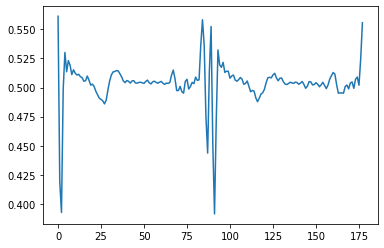

In [125]:
plt.plot(norm_df.iloc[0]['Point_norm_sample']+norm_df.iloc[1]['Point_norm_sample'])
plt.text(norm_df.iloc[0]['Point_norm_sample'][-1])

In [50]:
len(norm_df.iloc[0][2]), len(norm_df.iloc[0][3])


(93, 89)

In [43]:
len(df['Norm_amplitude_yvalue'].iloc[0])

93

In [39]:
df.iloc[0], df.iloc[1]

(RR_index                                                                 0
 RR_interval                                                           93.0
 Norm_amplitude_yvalue    [0.5622263561478792, 0.4243009990905343, 0.386...
 Name: 0, dtype: object,
 RR_index                                                                 1
 RR_interval                                                           89.0
 Norm_amplitude_yvalue    [0.5524580051179417, 0.451409925982508, 0.3913...
 Name: 0, dtype: object)

In [ ]:
# resampling 하면서 얻어진 rpeak 위치 찾기 


In [97]:
# Task: 1. R-R interval 나누기 + 3. R-R time frame(data points) Normalization 

# rr-interval
def minmax_norm_amplitude():
    df_rr_intervals = pd.DataFrame(columns=['RR_index', 'RR_interval', 'Norm_amplitude_yvalue'])

    for i in range(len(rpeaks)):
        if i + 1 == len(rpeaks):
            break
        else:
            rr_interval = rpeaks.iloc[i+1] - rpeaks.iloc[i]
            new_yval = yvals_MinMax[int(rpeaks.iloc[i]):int(rpeaks.iloc[i+1])]
            new_yval_1d = sum(new_yval.tolist(), [])

            # add data into dictionary(dataframe )
            tmp = pd.DataFrame({'RR_index':i, 'RR_interval':rr_interval, 'Norm_amplitude_yvalue': [new_yval_1d]})
                                # "rr_index: i " means 0:rpeak[1]-rpeak[0]
            df_rr_intervals = pd.concat([df_rr_intervals, tmp])
    return df_rr_intervals

# plt.hist(rr_intervals)# np.mean(rr_intervals), np.median(rr_intervals), np.max(rr_intervals)

In [35]:
# resampling
from scipy import signal

p_new_yval_1ds = []
point_norm_sample = int(np.median(df_rr_intervals['RR_interval']))
#new_column = 
for i in range(len(df_rr_intervals)):
    p_new_yval = signal.resample(df_rr_intervals['Norm_amplitude_yvalue'].iloc[i], point_norm_sample)
    p_new_yval_1d = p_new_yval.tolist()
    p_new_yval_1ds.append(p_new_yval_1d)
    
#norm_df = pd.concat(df_rr_intervals, df_rr_intervals[''])
norm_df = df_rr_intervals.assign(Point_norm_sample = p_new_yval_1ds)

NameError: name 'df_rr_intervals' is not defined

In [127]:
norm_df

,RR_index,RR_interval,Norm_amplitude_yvalue,new_column
0,0,93.0,"[0.5622263561478792, 0.4243009990905343, 0.386...","[0.5612516439336924, 0.41903476057316164, 0.39..."
0,1,89.0,"[0.5524580051179417, 0.451409925982508, 0.3913...","[0.552458005117943, 0.45140992598250795, 0.391..."
0,2,94.0,"[0.5500827901490235, 0.5054880704034215, 0.449...","[0.5502384223993755, 0.5020559457245233, 0.446..."
0,3,106.0,"[0.5543933604664523, 0.4997544434019189, 0.435...","[0.5540657589904348, 0.4850830180936692, 0.431..."
0,4,90.0,"[0.5456545483532782, 0.5184285115387768, 0.519...","[0.5454838661797972, 0.5182655889049094, 0.519..."
...,...,...,...,...
0,5151,90.0,"[0.6065367327802283, 0.5064764540708178, 0.363...","[0.6069028003849534, 0.5042907925935594, 0.362..."
0,5152,88.0,"[0.6399087659316696, 0.5124195506852108, 0.395...","[0.6399087659316696, 0.5147750095248959, 0.395..."
0,5153,88.0,"[0.6237300652954432, 0.6076425642234468, 0.435...","[0.6237300652954428, 0.6090694171073417, 0.438..."
0,5154,87.0,"[0.6578096871307446, 0.6177331407222859, 0.418...","[0.6578096871307451, 0.6208722874817755, 0.426..."


In [137]:
norm_df.iloc[3]#['RR_index']

RR_index                                                                 3
RR_interval                                                          106.0
Norm_amplitude_yvalue    [0.5543933604664523, 0.4997544434019189, 0.435...
Point_norm_sample        [0.5540657589904348, 0.4850830180936692, 0.431...
Name: 0, dtype: object

In [143]:
# cut off 0.95
int(len(cos_df) * 0.95)

4898

In [134]:
cos_df.head()#['[int(len(cos_df) * 0.95)]

,Unnamed: 0,index,cos_sim,original_points
0,0,1406,0.999919,96
1,1,2347,0.999893,93
2,2,2859,0.999891,99
3,3,399,0.999891,94
4,4,2158,0.999891,94


In [168]:
cutoff_95 = cos_df.iloc[0:4898]['index'].tolist()

In [159]:
# cufoff_95

In [214]:
ref_frame = norm_df.iloc[int(cos_df.iloc[0]['index'])]

In [220]:
cos_df.iloc[0], norm_df.iloc[0]

(Unnamed: 0            0.000000
 index              1406.000000
 cos_sim               0.999919
 original_points      96.000000
 Name: 0, dtype: float64,
 RR_index                                                                 0
 RR_interval                                                           93.0
 Norm_amplitude_yvalue    [0.5622263561478792, 0.4243009990905343, 0.386...
 Point_norm_sample        [0.5612516439336924, 0.41903476057316164, 0.39...
 Name: 0, dtype: object)

In [218]:
fig = plt.figure(figsize=(20,10))
plt.plot(ref_frame['Point_norm_sample'])

In [164]:
norm_df.iloc[0]['RR_index']

0

<ipython-input-174-e899bcec21c4>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(20,10))


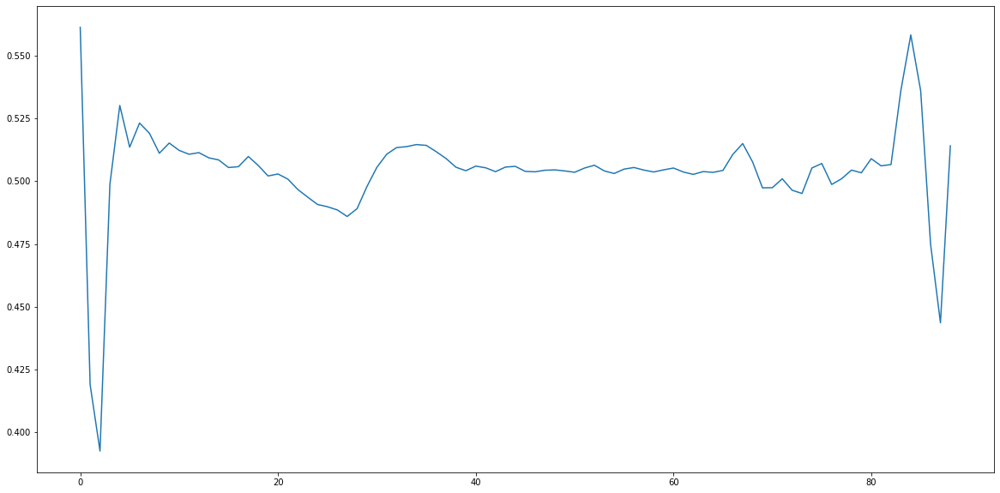

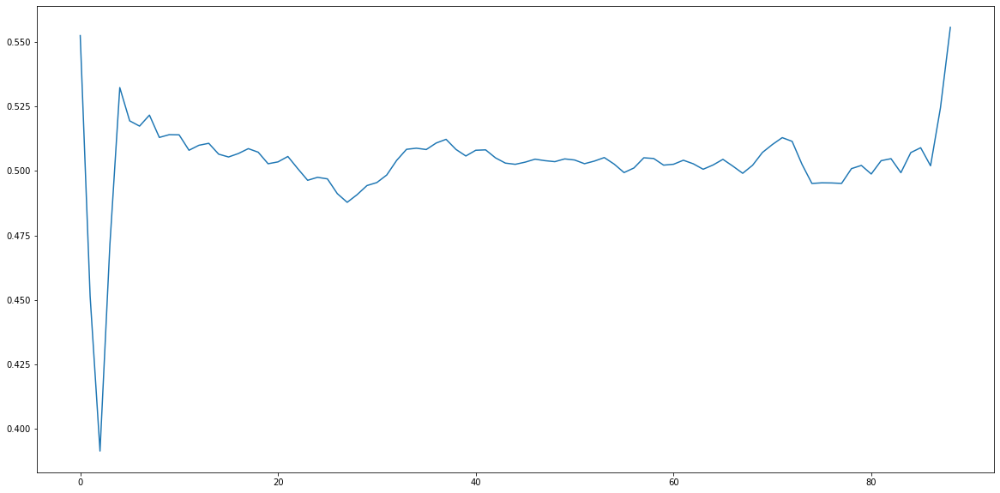

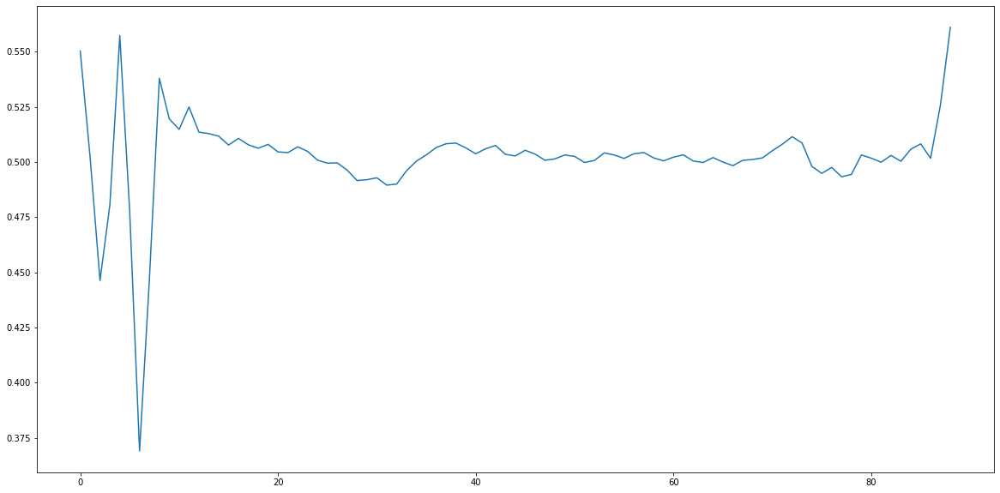

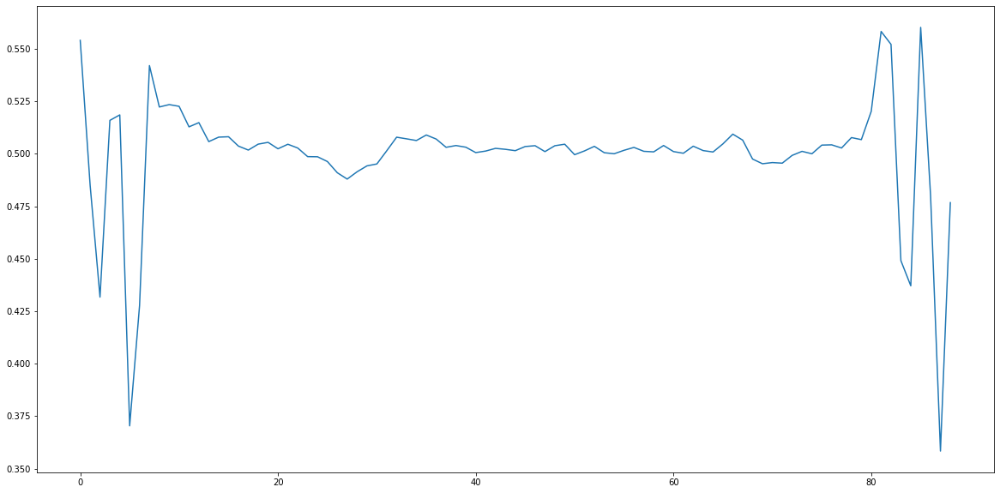

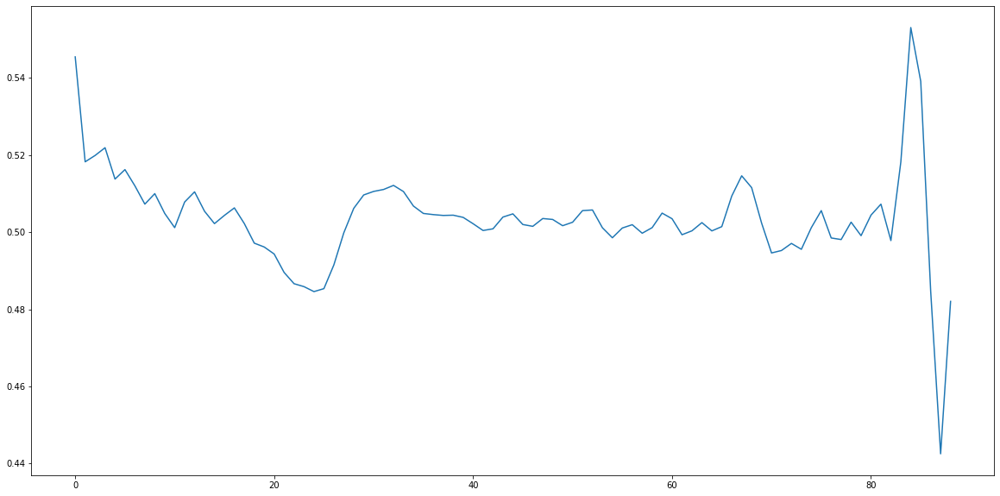

...

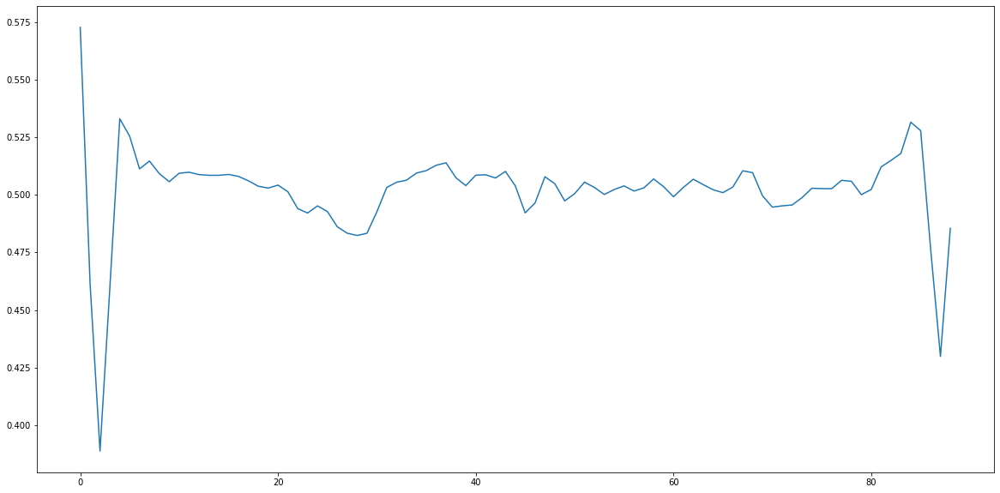

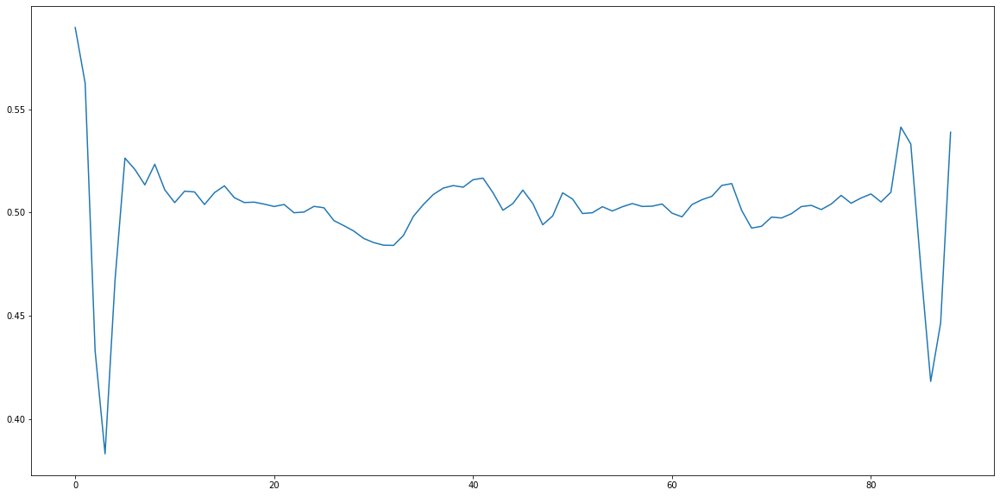

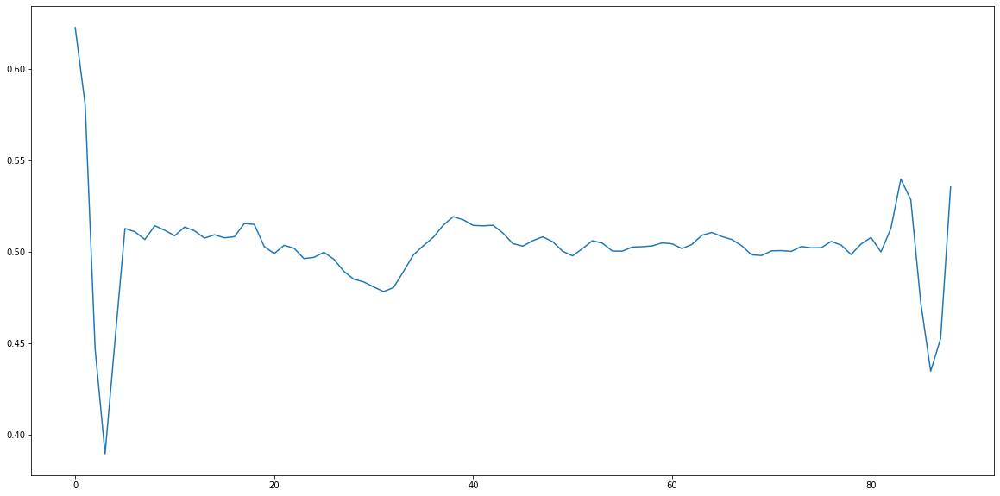

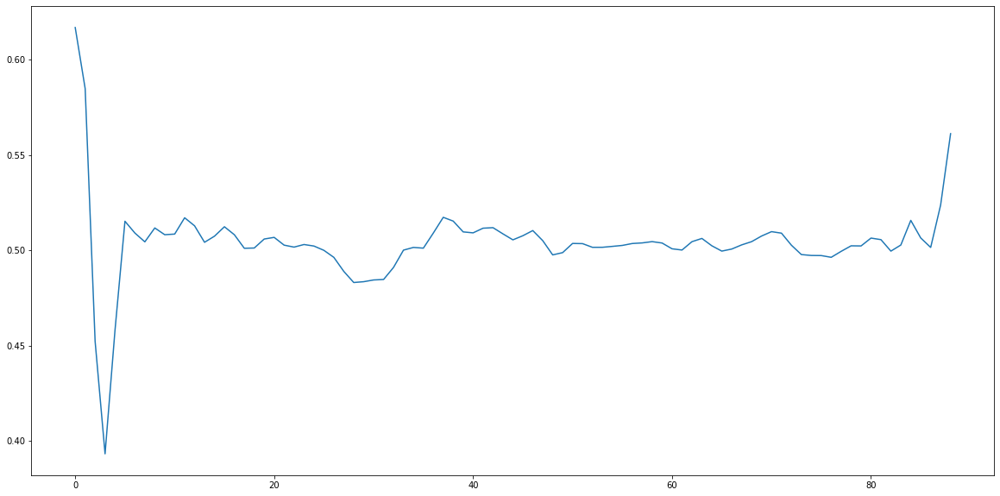

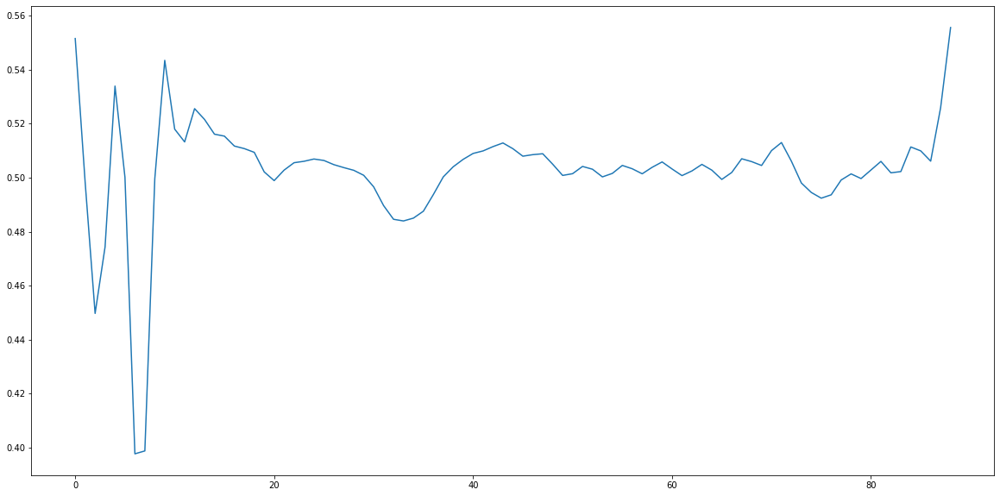

Error in callback <function flush_figures at 0x000001DB54087430> (for post_execute):


KeyboardInterrupt: 

In [174]:
for i in range(len(cutoff_95)):
    if norm_df.iloc[i]['RR_index'] in cutoff_95:
        fig = plt.figure(figsize=(20,10))
        plt.plot(norm_df.iloc[i]['Point_norm_sample'])

In [186]:
sample_yvals = sum(norm_df['Point_norm_sample'].tolist(), [])

In [180]:
len(sample_yvals)

458884

In [185]:
np.median(norm_df['RR_interval']) , len(norm_df), np.median(norm_df['RR_interval']) * len(norm_df)

(89.0, 5156, 458884.0)

In [198]:
fig = plt.figure(figsize=(20,10))
plt.plot(sample_yvals[0:5000])
%matplotlib qt

In [212]:
norm_df.iloc[0]['RR_index'] #1406

RR_index                                                                 0
RR_interval                                                           93.0
Norm_amplitude_yvalue    [0.5622263561478792, 0.4243009990905343, 0.386...
Point_norm_sample        [0.5612516439336924, 0.41903476057316164, 0.39...
Name: 0, dtype: object

In [190]:
amplitude_norm = sum(norm_df['Norm_amplitude_yvalue'].tolist(), [])

In [204]:
%matplotlib qt
plt.figure(figsize=(20,10))
plt.plot(amplitude_norm[0:1000])

In [209]:
fig = plt.figure(figsize=(20,10))
plt.plot(sample_yvals[0:1000])
# plt.plot(amplitude_norm[0:5000])

In [210]:
fig = plt.figure(figsize=(20,10))
plt.plot(yvals[0:1000])

In [221]:
rpeaks
yvals

,0
0,-0.001539
1,-0.020544
2,-0.016044
3,-0.030780
4,-0.040764
...,...
460795,-0.086164
460796,-0.030853
460797,0.024400
460798,0.022435


In [ ]:
new = data["Gender"].isin(["Male"])

In [130]:


for i in range(len(norm_df)):
    if norm_df['RR_index'][i]
    isin
    


KeyError: 'index_ID'

In [73]:
new_yval = yvals_MinMax[int(rpeaks.iloc[i]):int(rpeaks.iloc[i+1])]

In [91]:
pd.DataFrame({'RR_index':i, 'RR_interval':rr_interval})
pd.DataFrame({'Normalized_yvalue': [new_yval_1d]})#.transpose

,Normalized_yvalue
0,"[0.5622263561478792, 0.4243009990905343, 0.386..."


In [ ]:
pd.DataFrame({'RR_index':i, 'RR_interval':rr_interval, 'Normalized_yvalue': new_yval_1d})

In [ ]:
flat_list = [item for sublist in t for item in sublist]

[0.5622263561478792,
 0.4243009990905343,
 0.38683449097937256,
 0.4862087018640154,
 0.5320204345732628,
 0.5148913597883721,
 0.5202219146359569,
 0.5226830584460441,
 0.5119467552625387,
 0.5137173507631255,
 0.51437164294566,
 0.5105891286859723,
 0.5114586202346469,
 0.510464362840067,
 0.5089493423176324,
 0.5076829218744993,
 0.5047157421654178,
 0.5070725913036623,
 0.5098069463541638,
 0.5051464106106889,
 0.5020263754626423,
 0.5029090049489041,
 0.5006021887054725,
 0.49669806360978963,
 0.4937693234146143,
 0.4909155515906908,
 0.4898579737899864,
 0.4889777181352374,
 0.48626869485262003,
 0.48753338292073123,
 0.49521365512716353,
 0.5033060064768808,
 0.5090178227417114,
 0.5126896506706962,
 0.5136676092848939,
 0.5140912226171517,
 0.5147799959853084,
 0.5133671195111451,
 0.5107868533130058,
 0.5079775783969225,
 0.504760833648577,
 0.5044931399828293,
 0.5062106793827562,
 0.5049851372346722,
 0.5038648919249404,
 0.5057528572685058,
 0.5058895017401969,
 0.503949645

In [ ]:
# Task: 3. R-R time frame(data points) Normalization 
# rr_interval, yvals

rr_intervals = []
y_vals = []
for i in range(len(rpeaks)):
    if i + 1 == len(rpeaks):
        break
    else:
        rr_interval = rpeaks.iloc[i+1] - rpeaks.iloc[i]
        y_val = fxvals_MinMax[int(rpeaks.iloc[i]):int(rpeaks.iloc[i+1])]
        rr_intervals.append(int(rr_interval))
        y_vals.append(y_val)
        
len(y_vals), len(rr_intervals)